## IOM DATASET - Missing Migrants Global Figures All Data

In [1]:
import plotly.express as px
import geopandas as gpd
import pandas as pd 
import nbformat

In [2]:
!pip install leafmap

Defaulting to user installation because normal site-packages is not writeable


In [3]:
from leafmap import maplibregl
import leafmap

In [4]:
IOM_full = gpd.read_file("data/Missing_Migrants_Global_Figures_allData.csv")
IOM_full.head()

,Main ID,Incident ID,Incident Type,Region of Incident,Incident Date,Incident Year,Month,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,...,Region of Origin,Cause of Death,Country of Incident,Migration Route,Location of Incident,Coordinates,UNSD Geographical Grouping,Information Source,URL,Source Quality
0,2014.MMP00001,2014.MMP00001,Incident,North America,2014-01-06,2014,January,1,0,1,...,Central America,Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.650259, -110.366453",Northern America,Pima County Office of the Medical Examiner (PC...,http://humaneborders.info/,5
1,2014.MMP00002,2014.MMP00002,Incident,North America,2014-01-12,2014,January,1,0,1,...,Latin America / Caribbean (P),Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.59713, -111.73756",Northern America,Pima County Office of the Medical Examiner (PC...,,5
2,2014.MMP00003,2014.MMP00003,Incident,North America,2014-01-14,2014,January,1,0,1,...,Latin America / Caribbean (P),Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.94026, -113.01125",Northern America,Pima County Office of the Medical Examiner (PC...,,5
3,2014.MMP00004,2014.MMP00004,Incident,North America,2014-01-16,2014,January,1,0,1,...,Central America,Violence,United States of America,US-Mexico border crossing,"near Douglas, Arizona, USA","31.506777, -109.315632",Northern America,"Ministry of Foreign Affairs Mexico, Pima Count...",http://bit.ly/1qfIw00,5
4,2014.MMP00005,2014.MMP00005,Incident,Europe,2014-01-16,2014,January,1,0,1,...,Northern Africa,Harsh environmental conditions / lack of adequ...,Russian Federation,,Border between Russia and Estonia,"59.1551, 28",Northern Europe,EUBusiness (Agence France-Presse),http://bit.ly/1rTFTjR,1


In [5]:
from shapely.geometry import Point

# Convert the 'coordinates' field to a 'geometry' field
IOM_full['geometry'] = IOM_full['Coordinates'].apply(lambda x: Point(*map(float, x.split(','))))

# Set the 'geometry' field as the active geometry for the GeoDataFrame
IOM_full = IOM_full.set_geometry('geometry')

IOM_full.head()


,Main ID,Incident ID,Incident Type,Region of Incident,Incident Date,Incident Year,Month,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,...,Cause of Death,Country of Incident,Migration Route,Location of Incident,Coordinates,UNSD Geographical Grouping,Information Source,URL,Source Quality,geometry
0,2014.MMP00001,2014.MMP00001,Incident,North America,2014-01-06,2014,January,1,0,1,...,Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.650259, -110.366453",Northern America,Pima County Office of the Medical Examiner (PC...,http://humaneborders.info/,5,POINT (31.65 -110.366)
1,2014.MMP00002,2014.MMP00002,Incident,North America,2014-01-12,2014,January,1,0,1,...,Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.59713, -111.73756",Northern America,Pima County Office of the Medical Examiner (PC...,,5,POINT (31.597 -111.738)
2,2014.MMP00003,2014.MMP00003,Incident,North America,2014-01-14,2014,January,1,0,1,...,Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.94026, -113.01125",Northern America,Pima County Office of the Medical Examiner (PC...,,5,POINT (31.94 -113.011)
3,2014.MMP00004,2014.MMP00004,Incident,North America,2014-01-16,2014,January,1,0,1,...,Violence,United States of America,US-Mexico border crossing,"near Douglas, Arizona, USA","31.506777, -109.315632",Northern America,"Ministry of Foreign Affairs Mexico, Pima Count...",http://bit.ly/1qfIw00,5,POINT (31.507 -109.316)
4,2014.MMP00005,2014.MMP00005,Incident,Europe,2014-01-16,2014,January,1,0,1,...,Harsh environmental conditions / lack of adequ...,Russian Federation,,Border between Russia and Estonia,"59.1551, 28",Northern Europe,EUBusiness (Agence France-Presse),http://bit.ly/1rTFTjR,1,POINT (59.155 28)


In [6]:
IOM_full.columns

Index(['Main ID', 'Incident ID', 'Incident Type', 'Region of Incident',
       'Incident Date', 'Incident Year', 'Month', 'Number of Dead',
       'Minimum Estimated Number of Missing',
       'Total Number of Dead and Missing', 'Number of Survivors',
       'Number of Females', 'Number of Males', 'Number of Children',
       'Country of Origin', 'Region of Origin', 'Cause of Death',
       'Country of Incident', 'Migration Route', 'Location of Incident',
       'Coordinates', 'UNSD Geographical Grouping', 'Information Source',
       'URL', 'Source Quality', 'geometry'],
      dtype='object')

In [7]:
print(IOM_full['Incident Type'].unique())

print(IOM_full['Region of Incident'].unique())

['Incident' 'Cumulative Incident' 'Split Incident'
 'Incident,Split Incident' 'Cumulative Incident,Split Incident']
['North America' 'Europe' 'Mediterranean' 'Caribbean' 'South-eastern Asia'
 'Southern Asia' 'Eastern Africa' 'Central America' 'Middle Africa'
 'Northern Africa' 'Eastern Asia' 'Western Asia' 'Western Africa'
 'South America' 'Southern Africa' 'Central Asia'
 'Mediterranean,North America' 'Mediterranean,Northern Africa'
 'Central America,North America']


In [8]:
IOM_FULL_med_italy = IOM_full[(IOM_full['Region of Incident'].isin(['Mediterranean', 'Northern Africa', 'Mediterranean,Northern Africa'])) & (IOM_full['Country of Incident'] == 'Italy') ]

In [9]:
IOM_FULL_med_italy = IOM_FULL_med_italy.set_crs("EPSG:4326")
print(IOM_FULL_med_italy.crs)

EPSG:4326


In [10]:
IOM_FULL_med_italy.geometry.iloc[0].x, IOM_FULL_med_italy.geometry.iloc[0].y


(34.5645, 16.0)

In [11]:
IOM_FULL_med_italy['geometry'] = IOM_full['Coordinates'].apply(
    lambda x: Point(
        float(x.split(',')[1]),  # longitude
        float(x.split(',')[0])   # latitude
    )
)

In [12]:
IOM_FULL_med_italy.geometry.iloc[0].x, IOM_FULL_med_italy.geometry.iloc[0].y


(16.0, 34.5645)

In [13]:
m_IOM_med_italy = leafmap.Map()

In [14]:
m_IOM_med_italy.add_gdf(IOM_FULL_med_italy, 
                        point_style={
        "radius": 6,
        "color": "black",
        "fillColor": "red",
        "fillOpacity": 0.7,
    }, tooltip='Total Number of Dead and Missing')
m_IOM_med_italy

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [15]:
IOM_FULL_med_italy.head()

,Main ID,Incident ID,Incident Type,Region of Incident,Incident Date,Incident Year,Month,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,...,Cause of Death,Country of Incident,Migration Route,Location of Incident,Coordinates,UNSD Geographical Grouping,Information Source,URL,Source Quality,geometry
21,2014.MMP00022,2014.MMP00022,Incident,Mediterranean,2014-02-17,2014,February,2,0,2,...,Mixed or unknown,Italy,Central Mediterranean,Italy waters,"34.5645, 16",Uncategorized,Malta Today,http://bit.ly/V7JIqE,1,POINT (16 34.5645)
55,2014.MMP00056,2014.MMP00056,Incident,Mediterranean,2014-04-09,2014,April,1,0,1,...,Mixed or unknown,Italy,Central Mediterranean,Italy waters,"35.1092, 14",Uncategorized,Deutsche Welle,http://bit.ly/1okLaA1,1,POINT (14 35.1092)
97,2014.MMP00099,2014.MMP00099,Incident,Mediterranean,2014-06-05,2014,June,3,0,3,...,Mixed or unknown,Italy,Central Mediterranean,Italian waters,"35.358, 13",Uncategorized,Reuters,http://reut.rs/2bBvz2p,1,POINT (13 35.358)
99,2014.MMP00101,2014.MMP00101,Incident,Mediterranean,2014-06-08,2014,June,4,0,4,...,Drowning,Italy,Central Mediterranean,Italian waters,"35.4125, 12",Uncategorized,The Guardian,http://bit.ly/1qNxMp5,1,POINT (12 35.4125)
100,2014.MMP00102,2014.MMP00102,Incident,Mediterranean,2014-06-09,2014,June,3,2,5,...,Drowning,Italy,Central Mediterranean,Italian waters,"36.4935, 14",Uncategorized,The Guardian,http://bit.ly/1kal8el,1,POINT (14 36.4935)


In [16]:
IOM_FULL_med_italy['geometry'].x

21       16.000000
55       14.000000
97       13.000000
99       12.000000
100      14.000000
           ...    
20113    13.013000
20116     8.595668
20124    12.611213
20611    12.603582
20617    10.293596
Length: 206, dtype: float64

In [19]:
import leafmap
import pandas as pd
from ipyleaflet import CircleMarker

# copia di lavoro
gdf = IOM_FULL_med_italy.copy()

# assicura CRS corretto
gdf = gdf.to_crs(epsg=4326)

# pulizia
gdf["Incident Date"] = pd.to_datetime(gdf["Incident Date"])
gdf = gdf.dropna(subset=["geometry", "Total Number of Dead and Missing"])

# estrai coordinate
gdf["lon"] = gdf.geometry.x
gdf["lat"] = gdf.geometry.y

# crea la mappa
m = leafmap.Map(
    center=(41.5, 14.0),
    zoom=5,
    basemap="CartoDB.Positron"
)

# aggiungi le bolle
for _, row in gdf.iterrows():
    value = row["Total Number of Dead and Missing"]

    # scala visiva (fondamentale!)
    radius = max(3, (int(value) ** 0.5) * 2)

    circle = CircleMarker(
        location=(row["lat"], row["lon"]),
        radius=int(radius),
        color="crimson",
        fill_color="crimson",
        fill_opacity=0.6,
        tooltip=(
            f"Date: {row['Incident Date'].date()}<br>"
            f"Dead & Missing: {int(value)}"
        )
    )

    m.add_layer(circle)

m


Map(center=[41.5, 14.0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

In [20]:
# per gli incidenti meglio plotly
import plotly.express as px
df = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(df, locations="iso_alpha", color="continent",
                     hover_name="country", size="pop",
                     projection="natural earth")
fig.show()

In [19]:
df.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
35,Algeria,Africa,2007,72.301,33333216,6223.367465,DZA,12
47,Angola,Africa,2007,42.731,12420476,4797.231267,AGO,24
59,Argentina,Americas,2007,75.320,40301927,12779.379640,ARG,32


In [20]:
import plotly.express as px

df = IOM_FULL_med_italy.copy()
print(df.crs)
df = df[df["Incident Year"] == '2025']

df["lon"] = df.geometry.x
df["lat"] = df.geometry.y

# assicurati che size sia numerico
df["Total Number of Dead and Missing"] = pd.to_numeric(
    df["Total Number of Dead and Missing"], errors="coerce"
)

fig = px.scatter_geo(
    df,
    lat="lat",
    lon="lon",
    size="Total Number of Dead and Missing",
    hover_name="Incident ID",
    projection="mercator",
    size_max=30
)

fig.show()


EPSG:4326


In [23]:
import leafmap
from ipyleaflet import CircleMarker
import numpy as np

gdf = IOM_FULL_med_italy[IOM_FULL_med_italy["Incident Year"] == '2024'].to_crs(epsg=4326)
gdf = gdf.dropna(subset=["geometry", "Total Number of Dead and Missing"])

gdf["lon"] = gdf.geometry.x
gdf["lat"] = gdf.geometry.y

# Mappa ad alta definizione
m = leafmap.Map(
    center=(41.5, 14.0),
    zoom=5,
    basemap="CartoDB.Positron"  # molto definita
)

markers = []
for _, row in gdf.iterrows():
    value = row["Total Number of Dead and Missing"]

    # scala VISIVA controllata
    radius = int(value)*2

    circle = CircleMarker(
        location=(row["lat"], row["lon"]),
        radius=radius,
        color="crimson",
        fill_color="crimson",
        fill_opacity=0.6,
        weight=1,
        tooltip=(
            f"Date: {row['Incident Date']}<br>"
            f"Dead & Missing: {int(value)}"
        )
    )
    print(circle)
    markers.append(circle)

for marker in markers:
    m.add_layer(marker)

m


CircleMarker(color='crimson', fill_color='crimson', fill_opacity=0.6, location=[35.20308, 12.763315], options=['color', 'dash_array', 'fill', 'fill_color', 'fill_opacity', 'line_cap', 'line_join', 'opacity', 'pm_ignore', 'pointer_events', 'radius', 'stroke', 'weight'], radius=72, weight=1)
CircleMarker(color='crimson', fill_color='crimson', fill_opacity=0.6, location=[37.363319, 13.322568], options=['color', 'dash_array', 'fill', 'fill_color', 'fill_opacity', 'line_cap', 'line_join', 'opacity', 'pm_ignore', 'pointer_events', 'radius', 'stroke', 'weight'], radius=2, weight=1)
CircleMarker(color='crimson', fill_color='crimson', fill_opacity=0.6, location=[36.050032, 12.38685], options=['color', 'dash_array', 'fill', 'fill_color', 'fill_opacity', 'line_cap', 'line_join', 'opacity', 'pm_ignore', 'pointer_events', 'radius', 'stroke', 'weight'], radius=2, weight=1)
CircleMarker(color='crimson', fill_color='crimson', fill_opacity=0.6, location=[35.511389, 12.61561], options=['color', 'dash_ar

Map(center=[41.5, 14.0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

In [57]:
m.save("mappa_incidenti.html")


In [23]:
gdf.geometry.geom_type.value_counts()


Point    31
Name: count, dtype: int64

In [24]:
print(gdf[["lat", "lon"]].nunique())


lat    31
lon    31
dtype: int64


In [24]:
import leafmap
from ipyleaflet import CircleMarker
import numpy as np

# Coordinate casuali nel Mediterraneo (lat: 30-46, lon: -6-36)
np.random.seed(42)  # Per riproducibilità
lats = np.random.uniform(30, 46, 3)
lons = np.random.uniform(-6, 36, 3)

# Crea mappa centrata sul Mediterraneo
m = leafmap.Map(center=(38, 15), zoom=4, basemap="CartoDB.Positron")

# Aggiungi 3 CircleMarker
for lat, lon in zip(lats, lons):
    print(lat)
    

gdf = IOM_FULL_med_italy[IOM_FULL_med_italy["Incident Year"] == '2024'].to_crs(epsg=4326)
gdf = gdf.dropna(subset=["geometry", "Total Number of Dead and Missing"])

gdf["lon"] = gdf.geometry.x
gdf["lat"] = gdf.geometry.y

m.add_circle_markers_from_xy(
    gdf, x="lon", y="lat", radius=5, color="blue", fill_color="black"
)

m  # Mostra la mappa


35.9926419015578
45.21142890255866
41.71190306898248


Map(center=[38, 15], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

In [25]:
import leafmap

m = leafmap.Map(
    center=(38, 15),
    zoom=4,
    basemap="CartoDB.Positron"
)

m.add_gdf_time_slider(
    gdf,
    time_columns="Incident Date",
    style={
        "radius": 6,
        "color": "crimson",
        "fillColor": "crimson",
        "fillOpacity": 0.6,
        "weight": 1,
    }
)

m


KeyError: 'I'

In [26]:
gdf = IOM_FULL_med_italy.to_crs(epsg=4326)
gdf = gdf.dropna(subset=["geometry", "Incident Date"])



In [27]:
geojson = gdf.__geo_interface__


In [28]:
from ipyleaflet import Map
from ipyleaflet import GeoJSON, LayersControl
from ipyleaflet import TimestampedGeoJson

m = Map(center=(38, 15), zoom=4, basemap="CartoDB.Positron")

time_layer = TimestampedGeoJson(
    geojson,
    period="P1Y",
    add_last_point=True,
    auto_play=False,
    loop=False,
    max_speed=1,
    loop_button=True,
    date_options="YYYY",
    time_slider_drag_update=True,
)

m.add(time_layer)
m.add(LayersControl())

m


ImportError: cannot import name 'TimestampedGeoJson' from 'ipyleaflet' (/var/data/python/lib/python3.12/site-packages/ipyleaflet/__init__.py)

In [29]:
import folium
import numpy as np

# Coordinate casuali nel Mediterraneo
np.random.seed(42)
lats = np.random.uniform(30, 46, 3)
lons = np.random.uniform(-6, 36, 3)

# Crea mappa
m = folium.Map(location=[38, 15], zoom_start=4, tiles="CartoDB positron")

# Aggiungi i 3 punti
for lat, lon in zip(lats, lons):
    folium.CircleMarker(
        location=[lat, lon],
        radius=10,
        color="blue",
        fill=True,
        fill_opacity=0.6,
        popup=f"Punto: {lat:.2f}, {lon:.2f}"
    ).add_to(m)

m  # Mostra la mappa


In [62]:
m.save('mappa_incidenti_folium.html')

In [30]:
import folium
import numpy as np

# Filtra e prepara i dati
gdf = IOM_FULL_med_italy[IOM_FULL_med_italy["Incident Year"] == '2024'].to_crs(epsg=4326)
gdf = gdf.dropna(subset=["geometry", "Total Number of Dead and Missing"])
gdf["lon"] = gdf.geometry.x
gdf["lat"] = gdf.geometry.y

# Crea mappa
m = folium.Map(location=[41.5, 14.0], zoom_start=5, tiles="CartoDB positron")

# Aggiungi i marker
for _, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=int(row["Total Number of Dead and Missing"]) * 0.5,
        color="crimson",
        fill=True,
        fill_color="crimson",
        fill_opacity=0.4,
        popup=f"Date: {row['Incident Date']}<br>Dead & Missing: {int(row['Total Number of Dead and Missing'])}"
    ).add_to(m)

m  # Mostra la mappa


In [70]:
m.save('mappa_incidenti_folium.html')

In [31]:
m = leafmap.Map(center=[40, -100], zoom=4)
data = "https://raw.githubusercontent.com/opengeos/leafmap/master/examples/data/us_cities.csv"
m.add_circle_markers_from_xy(
    data, x="longitude", y="latitude", radius=10, color="blue", fill_color="black"
)
m

Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

# Tentativo con Folum

In [55]:
import folium
import pandas as pd
import numpy as np
import geopandas as gpd


In [56]:
gdf = IOM_FULL_med_italy.to_crs(epsg=4326)
gdf = gdf.dropna(subset=["geometry", "Incident Date", "Total Number of Dead and Missing"])

gdf["lon"] = gdf.geometry.x
gdf["lat"] = gdf.geometry.y


In [57]:
gdf["Total Number of Dead and Missing"] = pd.to_numeric(
    gdf["Total Number of Dead and Missing"],
    errors="coerce"
)
gdf = gdf.dropna(subset=["Total Number of Dead and Missing"])

gdf["radius"] = np.clip(
    np.log1p(gdf["Total Number of Dead and Missing"]) * 5,
    3,
    30
)


In [58]:
import pandas as pd

gdf["Incident Date"] = pd.to_datetime(
    gdf["Incident Date"],
    errors="coerce"
)

gdf["time"] = gdf["Incident Date"].dt.strftime("%Y-%m-%d")


In [59]:
features = []

for _, row in gdf.iterrows():
    features.append({
        "type": "Feature",
        "geometry": {
            "type": "Point",
            "coordinates": [row["lon"], row["lat"]],
        },
        "properties": {
            "time": row["time"],
            "popup": f"""
            <b>Incident ID:</b> {row.get("Incident ID", "")}<br>
            <b>Morti e dispersi:</b> {row["Total Number of Dead and Missing"]}
            """,
            "icon": "circle",
            "iconstyle": {
                "fillColor": "crimson",
                "fillOpacity": 0.6,
                "stroke": "true",
                "color": "crimson",
                "weight": 1,
                "radius": row["radius"],
            },
        },
    })


In [60]:
geojson = {
    "type": "FeatureCollection",
    "features": features,
}


In [61]:
m = folium.Map(
    location=[38, 15],
    zoom_start=4,
    tiles="CartoDB positron"
)


In [62]:
from folium.plugins import TimestampedGeoJson

TimestampedGeoJson(
    geojson,
    period="P1M",              # passo annuale
    add_last_point=True,
    auto_play=False,
    loop=False,
    max_speed=0.5,
    loop_button=True,
    date_options="YYYY-MM",
    time_slider_drag_update=True,
).add_to(m)


In [63]:
m


In [64]:
m.save("bubble_map_with_folum.html")

In [65]:
gpd_12NM = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/World_12NM_v4_20231025_gpkg/eez_12nm_v4.gpkg')
gpd_24NM = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/World_24NM_v4_20231025_gpkg/eez_24nm_v4.gpkg')
gpd_EEZ = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/World_EEZ_v12_20231025_gpkg/eez_v12.gpkg')

In [66]:
gpd_12NM_it = gpd_12NM[gpd_12NM["TERRITORY1"] == "Italy"]
gpd_24NM_it = gpd_24NM[gpd_24NM["TERRITORY1"] == "Italy"]
gpd_EEZ_it   = gpd_EEZ[gpd_EEZ["TERRITORY1"] == "Italy"]


In [67]:
fg_12nm = folium.FeatureGroup(name="Territorial Waters (12 NM)")
fg_24nm = folium.FeatureGroup(name="Contiguous Zone (24 NM)")
fg_eez  = folium.FeatureGroup(name="Exclusive Economic Zone (EEZ)")


In [68]:
folium.GeoJson(
    gpd_12NM_it,
    style_function=lambda x: {
        "fillColor": "blue",
        "color": "blue",
        "weight": 2,
        "fillOpacity": 0.1,
    },
    tooltip=folium.GeoJsonTooltip(fields=["GEONAME"]),
).add_to(fg_12nm)


In [69]:
folium.GeoJson(
    gpd_24NM_it,
    style_function=lambda x: {
        "fillColor": "green",
        "color": "green",
        "weight": 2,
        "fillOpacity": 0.1,
        "dashArray": "5,5",
    },
    tooltip=folium.GeoJsonTooltip(fields=["GEONAME"]),
).add_to(fg_24nm)


In [70]:
folium.GeoJson(
    gpd_EEZ_it,
    style_function=lambda x: {
        "fillColor": "orange",
        "color": "orange",
        "weight": 1.5,
        "fillOpacity": 0.05,
    },
    tooltip=folium.GeoJsonTooltip(fields=["GEONAME"]),
).add_to(fg_eez)


In [71]:
fg_12nm.add_to(m)
fg_24nm.add_to(m)
fg_eez.add_to(m)


In [72]:
folium.LayerControl(collapsed=False).add_to(m)


In [73]:
m

In [74]:
m.save('bubble_map_and_marine_boundaries_with_folum.html')

In [75]:
gpd_ispi_standoffs = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/ISPI - Standoffs in the Central Mediterranean (Crisi in mare).xlsx')

In [76]:
gpd_ispi_standoffs.head()

,Field1,Field2,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12
0,numero crisi,imbarcazione,persone a bordo,inizio crisi,fine crisi,durata crisi,quanti ricollocati (accordi),dove sbarcati,dove sbarcati (in Italia),miglia nautiche da Lampedusa,None,None
1,crisis number,ship,persons onboard,start date,end date,length of standoff,relocated (agreed),disembarked,where disembarked (Italy),nautical miles from Lampedusa,None,None
2,1.0,Aquarius,629.0,2018/09/06,17/06/2018,9.0,0.0,Spagna,None,None,None,None
3,2.0,Diciotti,523.0,15/06/2018,19/06/2018,5.0,0.0,Italia,Pozzallo,130.0,None,None
4,3.0,Lifeline,234.0,21/06/2018,28/06/2018,8.0,220.0,Malta,None,None,None,None


In [77]:
gpd_ispi_standoffs_it = gpd.read_file("/home/enrique/github/data-science-unitn/geospatial-analysis/ispi_standoff_it.gpkg")
gpd_ispi_standoffs_it.head()

,crisis number,ship,persons onboard,start date,end date,length of standoff,relocated (agreed),disembarked,where disembarked (Italy),nautical miles from Lampedusa,notes,address,geometry
0,2,Diciotti,523,15/06/2018,19/06/2018,5,0,Italia,Pozzallo,130.0,None,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
1,4,Alexander Maersk,113,22/06/2018,26/06/2018,5,0,Italia,Pozzallo,130.0,None,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
2,5,Monte Sperone + Protector,447,13/07/2018,16/07/2018,4,270,Italia,Pozzallo,130.0,None,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
3,7,Diciotti,177,14/08/2018,25/08/2018,12,50,Italia,Catania,210.0,None,Catania,POINT (15.08783 37.50248)
4,13,Sea-Watch 3,47,19/01/2019,31/01/2019,13,32,Italia,Catania,210.0,None,Catania,POINT (15.08783 37.50248)


In [78]:
gpd_ispi_standoffs_it.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [79]:
gpd_ispi_standoffs_it

,crisis number,ship,persons onboard,start date,end date,length of standoff,relocated (agreed),disembarked,where disembarked (Italy),nautical miles from Lampedusa,notes,address,geometry
0,2,Diciotti,523,15/06/2018,19/06/2018,5,0,Italia,Pozzallo,130.0,None,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
1,4,Alexander Maersk,113,22/06/2018,26/06/2018,5,0,Italia,Pozzallo,130.0,None,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
2,5,Monte Sperone + Protector,447,13/07/2018,16/07/2018,4,270,Italia,Pozzallo,130.0,None,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
3,7,Diciotti,177,14/08/2018,25/08/2018,12,50,Italia,Catania,210.0,None,Catania,POINT (15.08783 37.50248)
4,13,Sea-Watch 3,47,19/01/2019,31/01/2019,13,32,Italia,Catania,210.0,None,Catania,POINT (15.08783 37.50248)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,567,Aurora SAR,42,13/12/2025,14/12/2025,2,0,Italia,Augusta,185.0,None,"Augusta, Siracusa",POINT (15.219 37.23375)
550,568,Life Support,113,13/12/2025,17/12/2025,5,0,Italia,Napoli,350.0,None,Napoli,POINT (14.25254 40.83998)
551,569,Solidaire,39,25/12/2025,29/12/2025,5,0,Italia,Livorno,510.0,None,Livorno,POINT (10.30784 43.55189)
552,570,Ocean Viking,33,31/12/2025,2026-05-01 00:00:00,6,0,Italia,Savona,570.0,None,Savona,POINT (8.47725 44.31107)


In [80]:
gpd_ispi_standoffs_it["start date"] = pd.to_datetime(gpd_ispi_standoffs_it["start date"], errors="coerce")
gpd_ispi_standoffs_it["end date"] = pd.to_datetime(gpd_ispi_standoffs_it["end date"], errors="coerce")

# teniamo solo righe valide
gpd_ispi_standoffs_it = gpd_ispi_standoffs_it.dropna(subset=["geometry", "start date", "end date", "persons onboard"])


In [81]:
features = []

for _, row in gpd_ispi_standoffs_it.iterrows():
    print(row.geometry.coords)
    feature = {
        "type": "Feature",
        "geometry": {
            "type": "Point",
            "coordinates": [row.geometry.x, row.geometry.y],
        },
        "properties": {
            "times": [
                row["start date"].isoformat(),
                row["end date"].isoformat(),
            ],
            "popup": f"""
            <b>Crisis number:</b> {row['crisis number']}<br>
            <b>Where disembarked:</b> {row['where disembarked (Italy)']}<br>
            <b>Persons onboard:</b> {row['persons onboard']}
            """,
            "style": {
                "color": "blue",
                "weight": 5,
            },
        },
    }

    features.append(feature)


In [82]:
geojson_ispi = {
    "type": "FeatureCollection",
    "features": features,
}


In [ ]:
from folium.plugins import TimestampedGeoJson

TimestampedGeoJson(
    geojson_ispi,
    period="P1M",
    duration="P1M", # -> P1W? o 2 settimane P2W? -> sintassi ISO 8601
    add_last_point=False,
    auto_play=False,
    loop=False,
    max_speed=0.5,
    loop_button=True,
    time_slider_drag_update=True,
    date_options="YYYY-MM"
).add_to(m)


In [84]:
m.save('bubble_map_and_marine_boundaries_ispi_with_folum.html')

In [82]:
print(features)

[{'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [14.8457021, 36.7260522]}, 'properties': {'times': ['2018-06-15T00:00:00', '2018-06-19T00:00:00'], 'popup': '\n            <b>Crisis number:</b> 2<br>\n            <b>Where disembarked:</b> Pozzallo<br>\n            <b>Persons onboard:</b> 523\n            ', 'style': {'color': 'blue', 'weight': 5}}}, {'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [14.8457021, 36.7260522]}, 'properties': {'times': ['2018-06-22T00:00:00', '2018-06-26T00:00:00'], 'popup': '\n            <b>Crisis number:</b> 4<br>\n            <b>Where disembarked:</b> Pozzallo<br>\n            <b>Persons onboard:</b> 113\n            ', 'style': {'color': 'blue', 'weight': 5}}}, {'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [14.8457021, 36.7260522]}, 'properties': {'times': ['2018-07-13T00:00:00', '2018-07-16T00:00:00'], 'popup': '\n            <b>Crisis number:</b> 5<br>\n            <b>Where disembarked:</b> Pozzallo

In [118]:
gpd_ispi_standoffs_it

,crisis number,ship,persons onboard,start date,end date,length of standoff,relocated (agreed),disembarked,where disembarked (Italy),nautical miles from Lampedusa,address,geometry
0,2,Diciotti,523,2018-06-15,2018-06-19,5,0,Italia,Pozzallo,130.0,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
1,4,Alexander Maersk,113,2018-06-22,2018-06-26,5,0,Italia,Pozzallo,130.0,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
2,5,Monte Sperone + Protector,447,2018-07-13,2018-07-16,4,270,Italia,Pozzallo,130.0,"Pozzallo, Ragusa",POINT (14.8457 36.72605)
3,7,Diciotti,177,2018-08-14,2018-08-25,12,50,Italia,Catania,210.0,Catania,POINT (15.08783 37.50248)
4,13,Sea-Watch 3,47,2019-01-19,2019-01-31,13,32,Italia,Catania,210.0,Catania,POINT (15.08783 37.50248)
...,...,...,...,...,...,...,...,...,...,...,...,...
255,278,Geo Barents,57,2023-11-17,2023-11-22,6,0,Italia,Ravenna,805.0,Ravenna,POINT (12.19659 44.41574)
256,279,Life Support,21,2023-11-20,2023-11-23,4,0,Italia,Marina di Carrara,530.0,"Marina di Carrara, Massa-Carrara",POINT (10.04142 44.03837)
257,280,Nadir,49,2023-11-20,2023-11-20,1,0,Italia,Lampedusa,0.0,"Lampedusa, Lampedusa e Linosa, Agrigento",POINT (12.60982 35.50112)
258,281,Aurora SAR,45,2023-11-22,2023-11-22,1,0,Italia,Lampedusa,0.0,"Lampedusa, Lampedusa e Linosa, Agrigento",POINT (12.60982 35.50112)


In [ ]:
# TODO -> RICORDARSI DI CARICARE DIRETTAMENTE I DATI DAL LINK https://docs.google.com/spreadsheets/d/1ahgkPp6NqMh3Dg63YHj8LVyaeW6-qHn2QQcRrKasJyM/edit?gid=0#gid=0
# RICORDARSI DI CONTROLLARE DATI ALLINEATI AL 2025

In [85]:
description_html = """
<div style="
    position: fixed;
    top: 10px; 
    left: 100px;
    z-index: 9999;
    background-color: rgba(255,255,255,0.9);
    padding: 10px 12px;
    border-radius: 6px;
    font-size: 13px;
    box-shadow: 0 0 6px rgba(0,0,0,0.3);
    max-width: 280px;
">
<b>Timeline:</b><br>
<ol>
<li>Standoffs (Source: ISPI)<br>
I Marker di posizione rappresentano il luogo e la data di sbarco dopo uno standoff in mare.
</li>
<li>Incidenti (Source: IOM)<br>
Le bolle rappresentano gli incidenti registrati. <br> 
La loro grandezza rispecchia il numero totale delle vittime accertate e dei dispersi.</li>
</ol>
</div>
"""

m.get_root().html.add_child(folium.Element(description_html))


In [86]:
m.save('bubble_map_and_marine_boundaries_ispi_with_folum_w_description.html')

# ANALISI DATI

In [17]:
data_12NM = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/World_12NM_v4_20231025_gpkg/eez_12nm_v4.gpkg')


In [18]:
data_24NM = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/World_24NM_v4_20231025_gpkg/eez_24nm_v4.gpkg')


In [19]:
gpd_EEZ = gpd.read_file('/home/enrique/github/data-science-unitn/geospatial-analysis/data/World_EEZ_v12_20231025_gpkg/eez_v12.gpkg')

In [21]:
IOM_FULL_med_italy.head()
IOM_FULL_med_italy_data_analisys = IOM_FULL_med_italy.copy()

In [22]:
IOM_FULL_med_italy_data_analisys['Incident Date'] = pd.to_datetime(IOM_FULL_med_italy_data_analisys['Incident Date']) 

In [23]:
IOM_FULL_med_italy_data_analisys['Incident Date']

21      2014-02-17
55      2014-04-09
97      2014-06-05
99      2014-06-08
100     2014-06-09
           ...    
20113   2025-10-05
20116   2025-10-14
20124   2025-10-19
20611   2025-10-29
20617   2025-11-03
Name: Incident Date, Length: 206, dtype: datetime64[ns]

In [24]:
import datetime

# governi come tuple (inizio, fine)
governi = {
    "Meloni": (pd.Timestamp("2022-10-22"), pd.Timestamp("2100-01-01")),
    "Draghi": (pd.Timestamp("2021-02-13"), pd.Timestamp("2022-10-22")),
    "Conte 2": (pd.Timestamp("2019-09-05"), pd.Timestamp("2021-02-13")),
    "Conte 1": (pd.Timestamp("2018-06-01"), pd.Timestamp("2019-09-05")),
    "Gentiloni": (pd.Timestamp("2016-12-12"), pd.Timestamp("2018-06-01")),
    "Renzi": (pd.Timestamp("2014-02-22"), pd.Timestamp("2016-12-12")),
    "Letta 1": (pd.Timestamp("2013-04-28"), pd.Timestamp("2014-02-22")),
}


In [25]:
def assegna_governo(data):
    for governo, (start, end) in governi.items():
        if start <= data < end:
            return governo
    return "Altro"  # per date fuori range


In [27]:
IOM_FULL_med_italy_data_analisys['Governo'] = IOM_FULL_med_italy_data_analisys['Incident Date'].apply(assegna_governo)


In [31]:
import seaborn as sns

<Axes: xlabel='Governo', ylabel='count'>

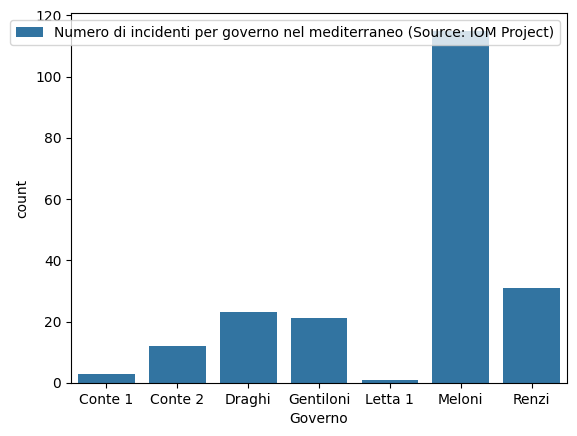

In [35]:

df_plot = (
    IOM_FULL_med_italy_data_analisys
        .groupby('Governo')['Incident Date']
        .count()
        .reset_index(name='count')
)

sns.barplot(
    df_plot,
            x="Governo", y='count',
            label='Numero di incidenti per governo nel mediterraneo (Source: IOM Project)')

In [ ]:
# NOTA -> TODO -> DEVO RECUPERARE IL DATASET DEGLI SBARCHI GIORNALIERI, SUDDIVEDERE IL DATO PER GOVERNO, SOMMANDO 
# GLI ARRIVI, E FARE UNA PROPORZIONE CON GLI INCIDENTI

NameError: name 'gpd_12NM_it' is not defined

In [ ]:
# NOTA -> TODO -> FARE IL WITHIN CON LE REGIONI MARITTIME
gpd_EEZ[gpd_EEZ['SOVEREIGN1'] == 'Italy']
data_12NM[data_12NM['TERRITORY1'] == 'Italy']
data_24NM[data_24NM['TERRITORY1'] == 'Italy']

In [38]:
import geopandas as gpd

# Filtro e seleziono solo le colonne desiderate
gdf1 = gpd_EEZ[gpd_EEZ['SOVEREIGN1'] == 'Italy'][['GEONAME', 'POL_TYPE', 'geometry']]
gdf2 = data_12NM[data_12NM['TERRITORY1'] == 'Italy'][['GEONAME', 'POL_TYPE', 'geometry']]
gdf3 = data_24NM[data_24NM['TERRITORY1'] == 'Italy'][['GEONAME', 'POL_TYPE', 'geometry']]


In [39]:
# Unisco i tre GeoDataFrame
gdf_combined = gpd.GeoDataFrame(pd.concat([gdf1, gdf2, gdf3], ignore_index=True), crs=gdf1.crs)


In [40]:
gdf_combined

,GEONAME,POL_TYPE,geometry
0,Italian Exclusive Economic Zone,200NM,"MULTIPOLYGON (((6.36944 41.51417, 6.93028 41.8..."
1,Italian 12 NM,12NM,"MULTIPOLYGON (((12.88611 36.07626, 12.88842 36..."
2,Italian 24 NM,24NM,"MULTIPOLYGON (((12.31643 35.34972, 12.31743 35..."


In [ ]:
joined = gpd.sjoin(
    IOM_FULL_med_italy_data_analisys,
    gdf_combined[['GEONAME', 'geometry']],
    predicate='within',
    how='left'
)

# gdf_regioni['macroregion'] = joined['macroregion']


In [72]:
joined['GEONAME'] = joined['GEONAME'].fillna("Outside territorial waters") 




In [73]:
joined.groupby(['GEONAME', 'Governo'])['Governo'].count()

df_plot_geoname_governo_count = (
    joined
        .groupby(['GEONAME', 'Governo'])['Governo']
        .count()
        .reset_index(name='count')
)

df_plot_geoname_governo_count

,GEONAME,Governo,count
0,Italian 12 NM,Conte 1,2
1,Italian 12 NM,Conte 2,4
2,Italian 12 NM,Draghi,9
3,Italian 12 NM,Gentiloni,1
4,Italian 12 NM,Meloni,51
5,Italian 12 NM,Renzi,3
6,Italian 24 NM,Draghi,2
7,Italian 24 NM,Meloni,3
8,Italian 24 NM,Renzi,1
9,Italian Exclusive Economic Zone,Conte 1,2


<Axes: xlabel='Governo', ylabel='count'>

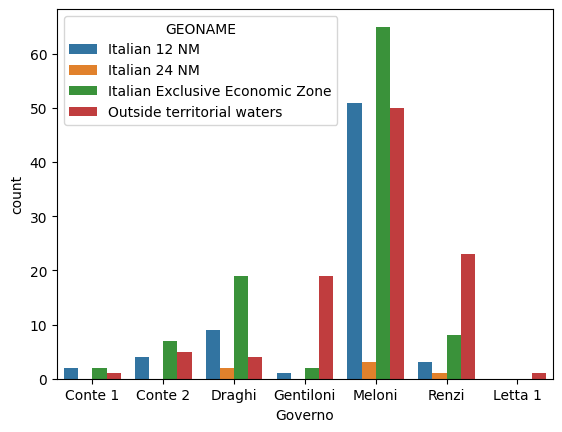

In [74]:
sns.barplot(df_plot_geoname_governo_count, x="Governo", y="count", hue="GEONAME")

<Axes: xlabel='Governo', ylabel='count'>

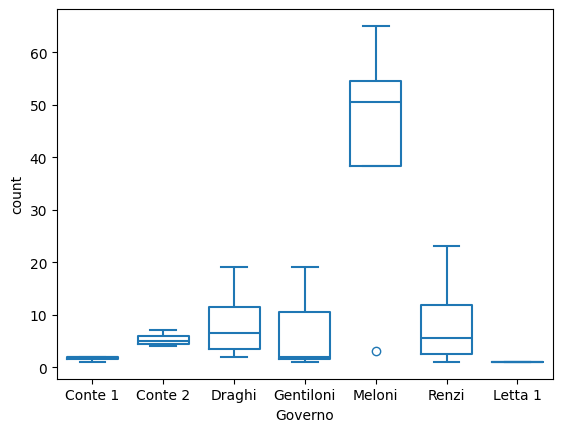

In [76]:
sns.boxplot(data=df_plot_geoname_governo_count, x="Governo", y="count", fill=False, gap=.1)

<Axes: xlabel='Governo', ylabel='Count'>

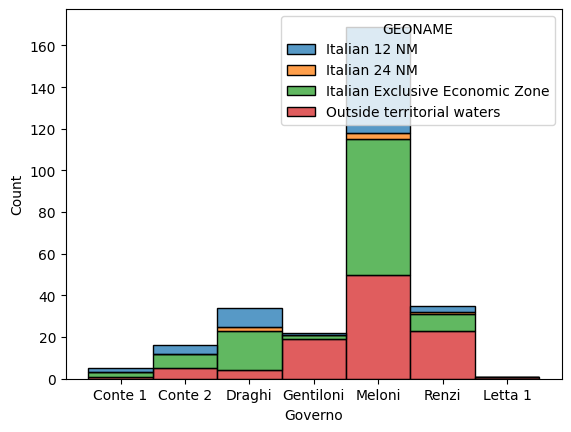

In [78]:
sns.histplot(
    data=df_plot_geoname_governo_count,
    x="Governo",
    weights="count",
    hue="GEONAME",
    multiple="stack"
)


<Axes: xlabel='Governo', ylabel='count'>

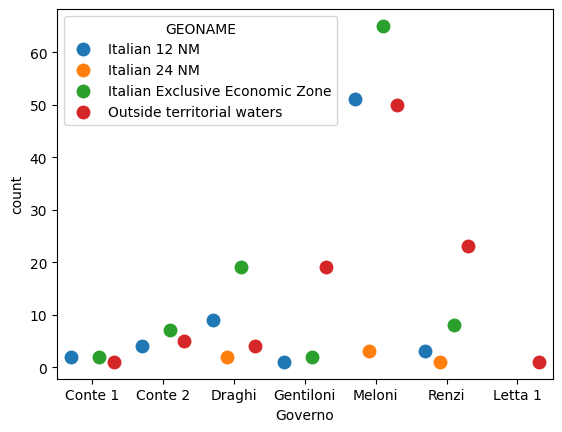

In [79]:
sns.stripplot(
    data=df_plot_geoname_governo_count,
    x="Governo",
    y="count",
    hue="GEONAME",
    dodge=True,
    size=10
)


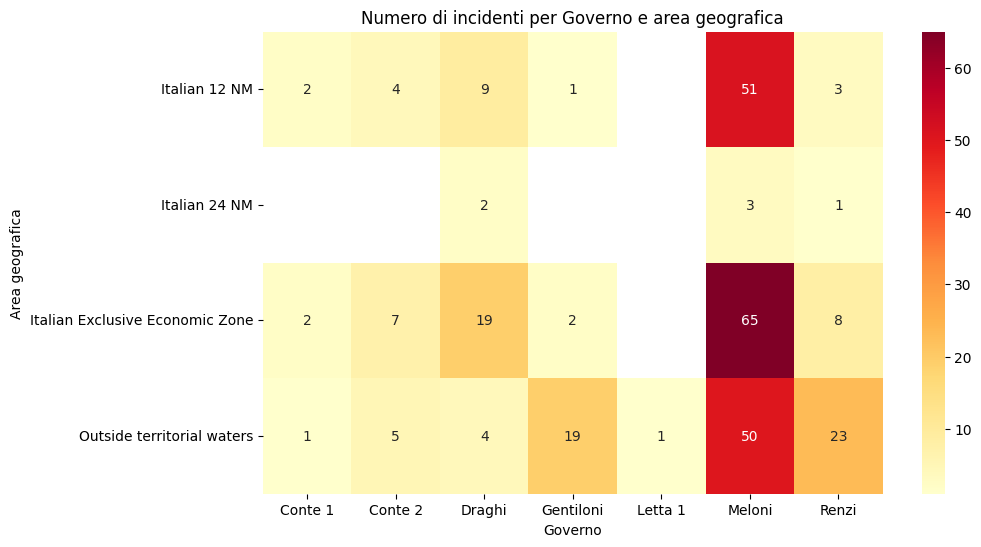

In [83]:
import matplotlib.pyplot as plt

pivot_table = df_plot_geoname_governo_count.pivot(
    index="GEONAME",
    columns="Governo",
    values="count"
)

plt.figure(figsize=(10,6))
sns.heatmap(pivot_table, annot=True, cmap="YlOrRd")
plt.title("Numero di incidenti per Governo e area geografica")
plt.ylabel("Area geografica")
plt.xlabel("Governo")
plt.show()
